In [100]:
import socnet as sn
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

sn.graph_width = 800
sn.graph_height = 450

sn.node_size = 20
sn.node_color = (255, 255, 255)

sn.edge_width = 2
sn.edge_color = (0, 0, 0)

sn.node_label_position = 'middle center'
sn.edge_label_distance = 10

lista_paises_chegaram = []
lista_paises_sairam = []

posicao_paises_sairam = {}
posicao_paises_chegaram = {}

In [101]:
G1970 = sn.load_graph('year_1970.gml')

sn.show_graph(G1970, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [102]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G1970
year = 1970

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no)+"\n")
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

print(lista_nome_paises_sairam)

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Guinea-Bissau - 0.095247862187

Pais que mais chegou pessoas Senegal - 0.096729329829557
['Congo, Rep.', 'Burundi', 'Rwanda', 'Angola', 'Botswana', 'Central African Republic', 'Sudan', 'Chad', 'Zambia', 'Armenia', 'Cyprus', 'Ethiopia', 'Greece', 'Romania', 'Tibetan', 'India', 'Mozambique', 'Kenya', 'Namibia', 'South Africa', 'VietNam', 'Cambodia', 'Lesotho', 'China', 'China, Macao SAR', 'Czech Republic', 'Morocco', 'Spain', 'Hungary', 'Poland', 'Russian Federation', 'Cuba', 'Mexico', 'Nepal', 'Bolivia', 'Peru', 'Cabo Verde', 'Senegal', 'Guinea-Bissau', 'Nigeria', 'Albania', 'Serbia and Kosovo (S/RES/1244 (1999))', 'Swaziland', 'Turkey', 'Bulgaria', 'United Rep. of Tanzania', 'Malawi', 'Uganda', 'Venezuela (Bolivarian Republic of)']


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,"Congo, Rep.",4,5,0.020390,0.002773,0.073885
1,Burundi,2,0,0.000000,0.000000,0.010088
2,Rwanda,0,5,0.000000,0.038969,0.000000
3,Angola,0,3,0.000000,0.061112,0.000000
4,Botswana,1,0,0.000000,0.000000,0.000621
5,Central African Republic,3,0,0.000000,0.000000,0.002747
6,Sudan,3,5,0.010638,0.016851,0.002367
7,Chad,0,2,0.000000,0.000521,0.000000
8,Zambia,5,1,0.011968,0.003115,0.003101
9,Armenia,0,1,0.000000,0.000079,0.000000


In [103]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_sairam)   

    
#print(posicao_paises_sairam)
#print("\n")
#print(lista_numero_pessoas_sairam)

#print("\n")


## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna")

Lista e quantidades dos países que mais saíram pessoas
[(0.095247862187, 'Guinea-Bissau'), (0.06111226626370001, 'Angola'), (0.03896881136692, 'Rwanda'), (0.016851298909619998, 'Sudan'), (0.006556762218650001, 'Mozambique'), (0.0031145721722999997, 'Zambia'), (0.002773122451294, 'Congo, Rep.'), (0.0024212975921999997, 'Greece'), (0.0020182825494, 'Albania'), (0.001916209329, 'Cuba')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.096729329829557, 'Senegal'), (0.07388469967130001, 'Congo, Rep.'), (0.02811534770842, 'Uganda'), (0.010088140848299999, 'Burundi'), (0.009867265289556, 'United Rep. of Tanzania'), (0.0043048616075, 'Serbia and Kosovo (S/RES/1244 (1999))'), (0.00310148594679, 'Zambia'), (0.0027465508476379997, 'Central African Republic'), (0.00236728817034, 'Sudan'), (0.0020424637950000003, 'Ethiopia')]


100.0% veio do país que mais saiu pessoas


In [104]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_1970 = []
imports_1970 = []

for j in pessoas_armas.values():
    sairam_1970.append(float(j[0]))
    imports_1970.append(float(j[1]))



In [105]:
from scipy import stats

print(stats.ttest_ind(sairam_1970, imports_1970))

Ttest_indResult(statistic=-0.7860651926703736, pvalue=0.43376527306016066)


In [106]:
G1980 = sn.load_graph('year_1980.gml')

sn.show_graph(G1980, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [107]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 #paises com maior
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G1980
year = 1980

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no))
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Equatorial Guinea - 0.187999608346912
Pais que mais chegou pessoas Gabon - 0.11749730736


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,"Congo, Rep.",5,7,0.012025,4.467653e-03,0.091680
1,Angola,3,3,0.002172,7.269286e-02,0.050301
2,Namibia,0,3,0.000000,5.492400e-02,0.000000
3,South Africa,0,8,0.000000,8.148393e-04,0.000000
4,Afghanistan,0,5,0.000000,1.309535e-01,0.000000
5,United Arab Emirates,4,0,0.000000,0.000000e+00,0.000137
6,Ethiopia,1,15,0.011261,7.282023e-02,0.000748
7,United Rep. of Tanzania,4,2,0.000603,0.000000e+00,0.036269
8,Uganda,3,7,0.003177,2.032353e-02,0.016804
9,Argentina,0,1,0.000000,1.352030e-06,0.000000


In [108]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass



## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas\n")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna\n")

Lista e quantidades dos países que mais saíram pessoas
[(0.187999608346912, 'Equatorial Guinea'), (0.13095354367189, 'Afghanistan'), (0.072820230471241, 'Ethiopia'), (0.07269286330923, 'Angola'), (0.05794632392713, 'Cambodia'), (0.0557609095692319, 'Rwanda'), (0.054924003034399996, 'Namibia'), (0.0489800405185, 'Chad'), (0.041313956877088505, 'Burundi'), (0.035067817750890004, 'Lao PDR')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.11749730736, 'Gabon'), (0.1078042053, 'Pakistan'), (0.0948775901, 'Cameroon'), (0.091680098938, 'Congo, Rep.'), (0.08331288003, 'Thailand'), (0.0567136193, 'Somalia'), (0.0503011350039, 'Angola'), (0.037681170571000004, 'Burundi'), (0.036268863840191005, 'United Rep. of Tanzania'), (0.024841557087, 'Iran, Islamic Rep.')]


62.49869794578748% veio do país que mais saiu pessoas



In [109]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_1980 = []
imports_1980 = []

for j in pessoas_armas.values():
    sairam_1980.append(float(j[0]))
    imports_1980.append(float(j[1]))

print(sairam_1980)
print(imports_1980)

[0.0044676532209301, 0.07269286330923, 0.054924003034399996, 0.0008148392544670001, 0.13095354367189, 0.0, 0.072820230471241, 0.0, 0.020323533772171602, 1.352029866e-06, 0.0, 0.0, 0.041313956877088505, 0.0557609095692319, 0.0, 0.020003475447899998, 0.0, 3.0413761329999998e-05, 4.1267826539999995e-08, 0.0, 5.34303017e-05, 0.02695915173148, 0.0489800405185, 0.0, 0.0, 0.0, 0.00013358510648999998, 0.00726815758439, 2.445897262e-08, 0.187999608346912, 0.0, 0.000205459797, 0.0, 0.0001721372172657, 0.0, 0.0001029730517, 0.0049109052255, 0.0, 0.0, 0.0, 0.0006679749601, 0.0, 0.0, 1.034248359e-07, 0.0, 0.0, 1.333647541e-07, 0.0007480285326318, 0.0, 0.0, 0.0, 3.526054692e-05, 0.0, 0.0, 6.780103907e-06, 1.2413294429999998e-06, 0.0022776817653689997, 0.00022720222674, 0.0, 0.0006291174728200001, 0.00010742798374, 3.712675061e-05, 3.813981357e-05, 1.851504181e-07, 0.006245832574096, 7.123436742e-05, 0.05794632392713, 0.035067817750890004, 6.367515607e-05, 2.929800229e-07, 1.3239950920000001e-05, 3.4

In [110]:
print(stats.ttest_ind(sairam_1980, imports_1980))

Ttest_indResult(statistic=-0.20085609832036216, pvalue=0.8409933527782556)


In [111]:
G1990 = sn.load_graph('year_1990.gml')

sn.show_graph(G1990, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [112]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 #paises com maior
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G1990
year = 1990

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no))
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Afghanistan - 0.5192763329390779
Pais que mais chegou pessoas Iran, Islamic Rep. - 0.31363410792


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,Afghanistan,0,11,0.000000,5.192763e-01,0.000000e+00
1,"Congo, Rep.",9,12,0.008368,1.950132e-03,3.439705e-02
2,Angola,3,7,0.002380,3.407649e-02,4.952230e-04
3,Namibia,0,6,0.000000,2.334077e-03,0.000000e+00
4,South Africa,0,13,0.000000,3.935781e-04,0.000000e+00
5,Argentina,0,5,0.000000,1.020479e-05,0.000000e+00
6,Australia,0,0,0.000000,0.000000e+00,0.000000e+00
7,Austria,0,0,0.000000,0.000000e+00,0.000000e+00
8,Burundi,4,6,0.000839,3.544364e-02,3.424052e-02
9,Rwanda,1,8,0.000050,4.993534e-02,4.414620e-03


In [113]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_sairam)   

    
#print(posicao_paises_sairam)
#print("\n")
#print(lista_numero_pessoas_sairam)

#print("\n")


## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas\n")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna\n")

Lista e quantidades dos países que mais saíram pessoas
[(0.5192763329390779, 'Afghanistan'), (0.350790470498605, 'Liberia'), (0.09424328799905973, 'Mozambique'), (0.06628917097064939, 'Somalia'), (0.06491468746598339, 'Iraq'), (0.049935335395127206, 'Rwanda'), (0.0354436363564565, 'Burundi'), (0.034076491026723, 'Angola'), (0.0325790565319082, 'Lao PDR'), (0.0325095806234664, 'Mauritania')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.31363410792, 'Iran, Islamic Rep.'), (0.26726147040004994, 'Pakistan'), (0.1549661649, 'Guinea'), (0.12963233067697202, "Cote d'Ivoire"), (0.0750627609726, 'Ethiopia'), (0.06999241903678, 'Malawi'), (0.059998130870000006, 'Sierra Leone'), (0.0421461042623, 'Sudan'), (0.037541491793300005, 'United Rep. of Tanzania'), (0.03439704518822301, 'Congo, Rep.')]


48.12555270631197% veio do país que mais saiu pessoas



In [114]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_1990 = []
imports_1990 = []

for j in pessoas_armas.values():
    sairam_1990.append(float(j[0]))
    imports_1990.append(float(j[1]))



In [115]:
print(stats.ttest_ind(sairam_1990,imports_1990))

Ttest_indResult(statistic=1.2312855790030328, pvalue=0.2192001007207234)


In [116]:
G2000 = sn.load_graph('year_2000.gml')

sn.show_graph(G2000, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [117]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 #paises com maior
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G2000
year = 2000

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no))
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Eritrea - 0.4510818641288586
Pais que mais chegou pessoas Eritrea - 0.3243822209361997


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,Afghanistan,5,78,0.003764,2.378244e-01,3.775462e-02
1,India,15,44,0.013630,2.014622e-05,4.195688e-03
2,Iraq,7,96,0.018152,2.476282e-02,7.985244e-04
3,Tajikistan,4,29,0.000809,9.987605e-03,7.758589e-04
4,Turkey,27,43,0.010465,9.117946e-04,3.966078e-04
5,Angola,20,59,0.008476,4.290902e-02,1.599011e-02
6,Burundi,8,69,0.004341,9.914016e-02,9.606660e-03
7,Central African Republic,20,21,0.003483,6.790971e-05,2.233725e-03
8,Cameroon,6,47,0.000630,2.330722e-04,5.599948e-03
9,"Congo, Rep.",15,94,0.021270,9.475557e-03,3.062901e-02


In [118]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_sairam)   

    
#print(posicao_paises_sairam)
#print("\n")
#print(lista_numero_pessoas_sairam)

#print("\n")


## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas\n")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna\n")

Lista e quantidades dos países que mais saíram pessoas
[(0.4510818641288586, 'Eritrea'), (0.2929355251177705, 'Bosnia and Herzegovina'), (0.23782437687612099, 'Afghanistan'), (0.20826997016811272, 'Sierra Leone'), (0.201650514490692, 'Timor-Leste'), (0.19006968758277598, 'Bhutan'), (0.15168960402841383, 'Liberia'), (0.10710434112877766, 'Azerbaijan'), (0.09914015735427421, 'Burundi'), (0.09098011748667499, 'Croatia')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.3243822209361997, 'Eritrea'), (0.1950951335621358, 'Indonesia'), (0.1899117620874326, 'Nepal'), (0.15931499405956637, 'Bosnia and Herzegovina'), (0.12492548726383919, 'Sudan'), (0.12258817578949592, 'Serbia and Kosovo (S/RES/1244 (1999))'), (0.12111782776295689, 'Guinea'), (0.11197478375403719, 'Sierra Leone'), (0.10346712038129917, 'Pakistan'), (0.10162511213879388, 'Iran, Islamic Rep.')]


71.87517765231694% veio do país que mais saiu pessoas



99.94872415149028 % de quem chegou no país foi de migração intern

In [119]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_2000 = []
imports_2000 = []

for j in pessoas_armas.values():
    sairam_2000.append(float(j[0]))
    imports_2000.append(float(j[1]))



In [120]:
print(stats.ttest_ind(sairam_2000, imports_2000))

Ttest_indResult(statistic=3.0151631595810247, pvalue=0.0027373070643233774)


In [121]:
G2010 = sn.load_graph('year_2010.gml')

sn.show_graph(G2010, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [122]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 #paises com maior
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G2010
year = 2010

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no))
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Somalia - 0.1872368079104556
Pais que mais chegou pessoas Latvia - 0.15585556397436706


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,Colombia,35,52,0.031457,0.089900,8.000346e-02
1,Aruba,1,1,0.000000,0.000010,2.177791e-08
2,Afghanistan,6,94,0.003579,0.152916,4.147566e-02
3,China,17,69,0.030189,0.000144,3.404978e-03
4,Eritrea,3,92,0.004819,0.053762,3.955347e-04
5,"Iran, Islamic Rep.",13,96,0.021026,0.001138,3.757640e-02
6,Iraq,17,113,0.023604,0.113159,5.757139e-02
7,Pakistan,21,84,0.017125,0.012892,8.242353e-02
8,Burundi,13,75,0.008519,0.029037,1.878736e-02
9,Angola,33,67,0.009424,0.005823,6.420211e-04


In [123]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_sairam)   

    
#print(posicao_paises_sairam)
#print("\n")
#print(lista_numero_pessoas_sairam)

#print("\n")


## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas\n")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna\n")

Lista e quantidades dos países que mais saíram pessoas
[(0.1872368079104556, 'Somalia'), (0.15627814290761977, 'Latvia'), (0.1529157193032851, 'Afghanistan'), (0.11315875676784776, 'Iraq'), (0.10457354655904398, 'Bhutan'), (0.09663270504381566, 'Georgia'), (0.08989987107243035, 'Colombia'), (0.08070068168488449, 'Central African Republic'), (0.07603672618702402, 'Estonia'), (0.06778666830101328, 'Azerbaijan')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.15585556397436706, 'Latvia'), (0.13331345273385767, 'Nepal'), (0.12175318344290251, 'Somalia'), (0.09209573797399001, 'Georgia'), (0.08242352918943231, 'Pakistan'), (0.08026084152958288, 'Sudan'), (0.08000345843795408, 'Colombia'), (0.07584491265119467, 'Estonia'), (0.0657453551181497, 'Azerbaijan'), (0.05757139087880353, 'Iraq')]


0.0003101727352549944% veio do país que mais saiu pessoas



99.99705812596602 % de quem chegou no país foi de migração interna



In [124]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_2010 = []
imports_2010 = []

for j in pessoas_armas.values():
    sairam_2010.append(float(j[0]))
    imports_2010.append(float(j[1]))



In [125]:
print(stats.ttest_ind(sairam_2010, imports_2010))

Ttest_indResult(statistic=4.403210275359743, pvalue=1.357925220457338e-05)


In [126]:
G2017 = sn.load_graph('year_2017.gml')

sn.show_graph(G2017, nlab=True)

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:59: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:187: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:188: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/Users/antoniosigrist/Desktop/Insper/6oSemestre/Redes/redesoc-2018/PF/socnet.py:190: RuntimeWarning:

invalid value encountered in double_scalars



In [127]:
## Variáveis para medição de in_degree e out_degree

maior_out_degree = 0 #paises com maior
maior_in_degree = 0
pais_maior_in_degree = []
pais_maior_out_degree = []

## Variáveis para análise dos successors

soma_pessoas_que_sairam = 0
pais_mais_saiu_pessoas_no = 0
pais_mais_saiu_pessoas = ""
lista_numero_pessoas_sairam = []

## Variáveis para análise dos predecessors

soma_pessoas_que_chegaram = 0
pais_mais_chegou_pessoas_no = 0
pais_mais_chegou_pessoas = ""
lista_numero_pessoas_chegaram  = []
lista_nome_paises_sairam = []

g = G2017
year = 2017

for n in g.nodes:
    
    if g.in_degree(n) > maior_in_degree:
        maior_in_degree = g.in_degree(n)
        pais_maior_in_degree = [g.nodes[n]['label']]
        
    elif g.in_degree(n) == maior_in_degree:
        pais_maior_in_degree.append(g.nodes[n]['label'])
        
    if g.out_degree(n) > maior_out_degree:
        maior_out_degree = g.out_degree(n)
        pais_maior_out_degree = [g.nodes[n]['label']]
        
    elif g.out_degree(n) == maior_out_degree:
        pais_maior_out_degree.append(g.nodes[n]['label'])
        
    for i in g.successors(n):
        soma_pessoas_que_sairam += g.get_edge_data(n,i)['weight']
    
    if soma_pessoas_que_sairam > pais_mais_saiu_pessoas_no:
        pais_mais_saiu_pessoas_no = soma_pessoas_que_sairam
        pais_mais_saiu_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_sairam.append(soma_pessoas_que_sairam)
    lista_nome_paises_sairam.append(g.nodes[n]['label'])
    soma_pessoas_que_sairam = 0
    
    for i in g.predecessors(n):
        soma_pessoas_que_chegaram += g.get_edge_data(i,n)['weight']
    
    if soma_pessoas_que_chegaram > pais_mais_chegou_pessoas_no:
        pais_mais_chegou_pessoas_no = soma_pessoas_que_chegaram
        pais_mais_chegou_pessoas = g.nodes[n]['label']
        
    lista_numero_pessoas_chegaram.append(soma_pessoas_que_chegaram)
    soma_pessoas_que_chegaram = 0
    

print ("Pais que mais saiu pessoas "+ pais_mais_saiu_pessoas + ' - ' + str(pais_mais_saiu_pessoas_no))
print ("Pais que mais chegou pessoas "+ pais_mais_chegou_pessoas + ' - ' + str(pais_mais_chegou_pessoas_no))

betweenness = nx.betweenness_centrality(g)

pd.DataFrame({
    'nome': [g.nodes[n]['label'] for n in g.nodes],
    'indegree':[g.in_degree(n) for n in g.nodes],
    'outdegree':[g.out_degree(n) for n in g.nodes],
    'betweenness': [betweenness[n] for n in g.nodes],
    'Qntd de pessoas que sairam': lista_numero_pessoas_sairam,
    'Qntd de pessoas que chegaram': lista_numero_pessoas_chegaram,
})

Pais que mais saiu pessoas Syrian Arab Republic - 0.7273338263568989
Pais que mais chegou pessoas Syrian Arab Republic - 0.3748303866465002


,nome,indegree,outdegree,betweenness,Qntd de pessoas que sairam,Qntd de pessoas que chegaram
0,Colombia,43,50,1.208431e-02,0.161047,1.564963e-01
1,Aruba,3,0,0.000000e+00,0.000000,0.000000e+00
2,Cuba,11,66,6.220744e-03,0.001615,4.795588e-06
3,Venezuela (Bolivarian Republic of),30,51,1.143214e-02,0.000000,2.524617e-03
4,Afghanistan,7,101,2.793207e-03,0.150197,6.732605e-02
5,"Iran, Islamic Rep.",7,100,1.886286e-03,0.002420,2.751245e-02
6,Iraq,32,113,1.920084e-02,0.125665,1.228122e-01
7,Pakistan,27,105,2.306151e-02,0.003359,4.162415e-02
8,Tajikistan,6,41,9.632381e-05,0.000553,8.319711e-05
9,Turkey,78,98,4.511055e-02,0.001178,1.970483e-01


In [128]:
## Análise dos 10 países que mais saem pessoas 
print("Lista e quantidades dos países que mais saíram pessoas")
print(sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)[:10])

ordem_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

contador = 0

for i in ordem_sairam:
    
    if contador < 10:
        
        if i[1] not in lista_paises_sairam:
            posicao_paises_sairam[i[1]] = [(year,ordem_sairam.index(i))]

        else:
             posicao_paises_sairam[i[1]].append((year,ordem_sairam.index(i)))

        lista_paises_sairam.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_sairam:
     lista_tita.append(j[1])

for pais in lista_paises_sairam:
    
    if pais not in posicao_paises_sairam:
        posicao_paises_sairam[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_sairam[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_sairam)   

    
#print(posicao_paises_sairam)
#print("\n")
#print(lista_numero_pessoas_sairam)

#print("\n")


## Análise dos 10 países que mais chegam pessoas 
print("Lista e quantidades dos países que mais chegaram pessoas")
print(sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)[:10])

contador = 0

ordem_chegaram = sorted(zip(lista_numero_pessoas_chegaram,lista_nome_paises_sairam), reverse=True)

for i in ordem_chegaram:
    
    if contador < 10:
        
        if i[1] not in lista_paises_chegaram:
            posicao_paises_chegaram[i[1]] = [(year,ordem_chegaram.index(i))]

        else:
             posicao_paises_chegaram[i[1]].append((year,ordem_chegaram.index(i)))

        lista_paises_chegaram.append(i[1])
    
    contador += 1

lista_tita = []
    
for j in ordem_chegaram:
     lista_tita.append(j[1])

for pais in lista_paises_chegaram:
    
    if pais not in posicao_paises_chegaram:
        posicao_paises_chegaram[pais] = [(year,lista_tita.index(pais[1]))]
        
    else:
        try:
            posicao_paises_chegaram[pais].append((year,lista_tita.index(pais[1])))
        except:
            pass

        
#print(posicao_paises_chegaram)   


for n in g.nodes:
    
    if g.nodes[n]['label'] == pais_mais_saiu_pessoas:
        for i in g.successors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
               # print (g.nodes[i]['label'])
                #print(g.get_edge_data(n,i)['weight'])
                print(str((g.get_edge_data(n,i)['weight']/pais_mais_saiu_pessoas_no*100)) + "% veio do país que mais saiu pessoas\n")
                
    if g.nodes[n]['label'] == pais_mais_chegou_pessoas:
        for i in g.predecessors(n):
            if g.nodes[i]['label'] == pais_mais_chegou_pessoas:
                print("\n")
                print(str((g.get_edge_data(i,n)['weight']/pais_mais_chegou_pessoas_no)*100)+" % de quem chegou no país foi de migração interna\n")

Lista e quantidades dos países que mais saíram pessoas
[(0.7273338263568989, 'Syrian Arab Republic'), (0.34694769617261306, 'South Sudan'), (0.30827030229280084, 'Central African Republic'), (0.21726606767734144, 'Somalia'), (0.16104701832985963, 'Colombia'), (0.15019726524775118, 'Afghanistan'), (0.12566484660916052, 'Iraq'), (0.080990019099702, 'Georgia'), (0.0775069800576512, 'Sudan'), (0.07287915543292671, 'Burundi')]
Lista e quantidades dos países que mais chegaram pessoas
[(0.3748303866465002, 'Syrian Arab Republic'), (0.19704832357991978, 'Turkey'), (0.18426877067141237, 'Central African Republic'), (0.15954528324925327, 'South Sudan'), (0.15649627204983096, 'Colombia'), (0.14659503462834428, 'Somalia'), (0.13437692661775438, 'Congo, Rep.'), (0.12281221596918071, 'Iraq'), (0.12236164278703149, 'Sudan'), (0.0973448373898882, 'Uganda')]


51.35625019586399% veio do país que mais saiu pessoas



99.65344137781302 % de quem chegou no país foi de migração interna



In [129]:
pessoas_armas = {}
nomes_sairam = sorted(zip(lista_numero_pessoas_sairam,lista_nome_paises_sairam), reverse=True)

for n in g.nodes:
    for i in range(len(nomes_sairam)):
        if nomes_sairam[i][1] == g.nodes[n]['label']:
            pessoas_armas[g.nodes[n]['label']] = [nomes_sairam[i][0],g.nodes[n]['imports']]

sairam_2017 = []
imports_2017 = []

for j in pessoas_armas.values():
    sairam_2017.append(float(j[0]))
    imports_2017.append(float(j[1]))



In [130]:
print(stats.ttest_ind(sairam_2017, imports_2017))

Ttest_indResult(statistic=2.989171802836859, pvalue=0.002960100432583515)


## Análise posição países que mais chegaram pessoas

{'Senegal': [(1970, 0)], 'Congo, Rep.': [(1970, 1), (1980, 3), (1990, 9), (2017, 6)], 'Uganda': [(1970, 2), (2017, 9)], 'Burundi': [(1970, 3), (1980, 7)], 'United Rep. of Tanzania': [(1970, 4), (1980, 8), (1990, 8)], 'Serbia and Kosovo (S/RES/1244 (1999))': [(1970, 5), (2000, 5)], 'Zambia': [(1970, 6)], 'Central African Republic': [(1970, 7), (2017, 2)], 'Sudan': [(1970, 8), (1990, 7), (2000, 4), (2010, 5), (2017, 8)], 'Ethiopia': [(1970, 9), (1990, 4)], 'Gabon': [(1980, 0)], 'Pakistan': [(1980, 1), (1990, 1), (2000, 8), (2010, 4)], 'Cameroon': [(1980, 2)], 'Thailand': [(1980, 4)], 'Somalia': [(1980, 5), (2010, 2), (2017, 5)], 'Angola': [(1980, 6)], 'Iran, Islamic Rep.': [(1980, 9), (1990, 0), (2000, 9)], 'Guinea': [(1990, 2), (2000, 6)], "Cote d'Ivoire": [(1990, 3)], 'Malawi': [(1990, 5)], 'Sierra Leone': [(1990, 6), (2000, 7)], 'Eritrea': [(2000, 0)], 'Indonesia': [(2000, 1)], 'Nepal': [(2000, 2), (2010, 1)], 'Bosnia and Herzegovina': [(2000, 3)], 'Latvia': [(2010, 0)], 'Georgia': [(

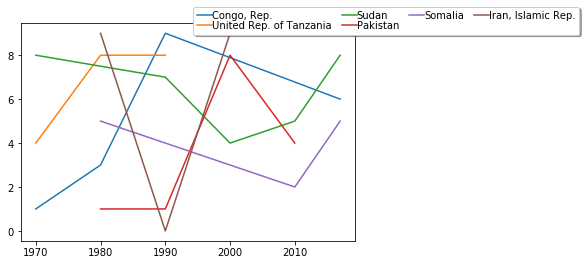

In [131]:
print(posicao_paises_chegaram)

labels = []

for i in posicao_paises_chegaram:
    
    if len(posicao_paises_chegaram[i])>2:
    
        ano = []
        legenda = ''
        posicao = []

        legenda = i

        for j in posicao_paises_chegaram[i]:

            ano.append(j[0])
            posicao.append(j[1])
        labels.append(i)

        plt.plot(ano, posicao)
    
plt.legend(labels, ncol=4, loc='upper left', 
           bbox_to_anchor=[0.5, 1.1], 
           columnspacing=1.0, labelspacing=0.0,
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True)
plt.show()

{'Senegal': [(1970, 0)], 'Congo, Rep.': [(1970, 1), (1980, 3), (1990, 9), (2017, 6)], 'Uganda': [(1970, 2), (2017, 9)], 'Burundi': [(1970, 3), (1980, 7)], 'United Rep. of Tanzania': [(1970, 4), (1980, 8), (1990, 8)], 'Serbia and Kosovo (S/RES/1244 (1999))': [(1970, 5), (2000, 5)], 'Zambia': [(1970, 6)], 'Central African Republic': [(1970, 7), (2017, 2)], 'Sudan': [(1970, 8), (1990, 7), (2000, 4), (2010, 5), (2017, 8)], 'Ethiopia': [(1970, 9), (1990, 4)], 'Gabon': [(1980, 0)], 'Pakistan': [(1980, 1), (1990, 1), (2000, 8), (2010, 4)], 'Cameroon': [(1980, 2)], 'Thailand': [(1980, 4)], 'Somalia': [(1980, 5), (2010, 2), (2017, 5)], 'Angola': [(1980, 6)], 'Iran, Islamic Rep.': [(1980, 9), (1990, 0), (2000, 9)], 'Guinea': [(1990, 2), (2000, 6)], "Cote d'Ivoire": [(1990, 3)], 'Malawi': [(1990, 5)], 'Sierra Leone': [(1990, 6), (2000, 7)], 'Eritrea': [(2000, 0)], 'Indonesia': [(2000, 1)], 'Nepal': [(2000, 2), (2010, 1)], 'Bosnia and Herzegovina': [(2000, 3)], 'Latvia': [(2010, 0)], 'Georgia': [(

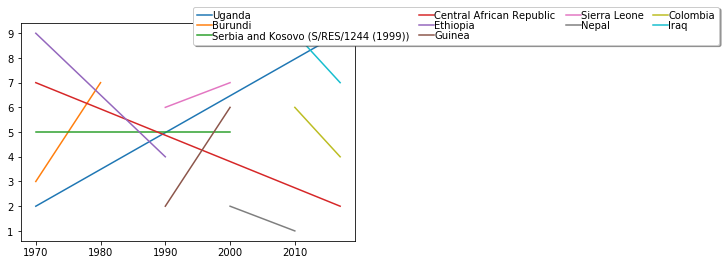

In [132]:
print(posicao_paises_chegaram)

labels = []

for i in posicao_paises_chegaram:
    
    if len(posicao_paises_chegaram[i])==2:
    
        ano = []
        legenda = ''
        posicao = []

        legenda = i

        for j in posicao_paises_chegaram[i]:

            ano.append(j[0])
            posicao.append(j[1])
        labels.append(i)

        plt.plot(ano, posicao)
    
plt.legend(labels, ncol=4, loc='upper left', 
           bbox_to_anchor=[0.5, 1.1], 
           columnspacing=1.0, labelspacing=0.0,
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True)
plt.show()

{'Senegal': [(1970, 0)], 'Congo, Rep.': [(1970, 1), (1980, 3), (1990, 9), (2017, 6)], 'Uganda': [(1970, 2), (2017, 9)], 'Burundi': [(1970, 3), (1980, 7)], 'United Rep. of Tanzania': [(1970, 4), (1980, 8), (1990, 8)], 'Serbia and Kosovo (S/RES/1244 (1999))': [(1970, 5), (2000, 5)], 'Zambia': [(1970, 6)], 'Central African Republic': [(1970, 7), (2017, 2)], 'Sudan': [(1970, 8), (1990, 7), (2000, 4), (2010, 5), (2017, 8)], 'Ethiopia': [(1970, 9), (1990, 4)], 'Gabon': [(1980, 0)], 'Pakistan': [(1980, 1), (1990, 1), (2000, 8), (2010, 4)], 'Cameroon': [(1980, 2)], 'Thailand': [(1980, 4)], 'Somalia': [(1980, 5), (2010, 2), (2017, 5)], 'Angola': [(1980, 6)], 'Iran, Islamic Rep.': [(1980, 9), (1990, 0), (2000, 9)], 'Guinea': [(1990, 2), (2000, 6)], "Cote d'Ivoire": [(1990, 3)], 'Malawi': [(1990, 5)], 'Sierra Leone': [(1990, 6), (2000, 7)], 'Eritrea': [(2000, 0)], 'Indonesia': [(2000, 1)], 'Nepal': [(2000, 2), (2010, 1)], 'Bosnia and Herzegovina': [(2000, 3)], 'Latvia': [(2010, 0)], 'Georgia': [(

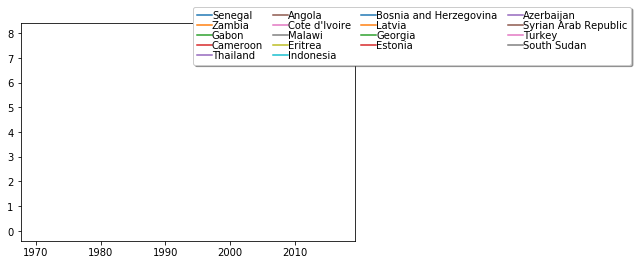

In [133]:
print(posicao_paises_chegaram)

labels = []

for i in posicao_paises_chegaram:
    
    if len(posicao_paises_chegaram[i])<=1:
    
        ano = []
        legenda = ''
        posicao = []

        legenda = i

        for j in posicao_paises_chegaram[i]:

            ano.append(j[0])
            posicao.append(j[1])
        labels.append(i)

        plt.plot(ano, posicao)
    
plt.legend(labels, ncol=4, loc='upper left', 
           bbox_to_anchor=[0.5, 1.1], 
           columnspacing=1.0, labelspacing=0.0,
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True)
plt.show()

## Análise posição países que mais saíram pessoas

{'Guinea-Bissau': [(1970, 0)], 'Angola': [(1970, 1), (1980, 3), (1990, 7)], 'Rwanda': [(1970, 2), (1980, 5), (1990, 5)], 'Sudan': [(1970, 3), (2017, 8)], 'Mozambique': [(1970, 4), (1990, 2)], 'Zambia': [(1970, 5)], 'Congo, Rep.': [(1970, 6)], 'Greece': [(1970, 7)], 'Albania': [(1970, 8)], 'Cuba': [(1970, 9)], 'Equatorial Guinea': [(1980, 0)], 'Afghanistan': [(1980, 1), (1990, 0), (2000, 2), (2010, 2), (2017, 5)], 'Ethiopia': [(1980, 2)], 'Cambodia': [(1980, 4)], 'Namibia': [(1980, 6)], 'Chad': [(1980, 7)], 'Burundi': [(1980, 8), (1990, 6), (2000, 8), (2017, 9)], 'Lao PDR': [(1980, 9), (1990, 8)], 'Liberia': [(1990, 1), (2000, 6)], 'Somalia': [(1990, 3), (2010, 0), (2017, 3)], 'Iraq': [(1990, 4), (2010, 3), (2017, 6)], 'Mauritania': [(1990, 9)], 'Eritrea': [(2000, 0)], 'Bosnia and Herzegovina': [(2000, 1)], 'Sierra Leone': [(2000, 3)], 'Timor-Leste': [(2000, 4)], 'Bhutan': [(2000, 5), (2010, 4)], 'Azerbaijan': [(2000, 7), (2010, 9)], 'Croatia': [(2000, 9)], 'Latvia': [(2010, 1)], 'Georg

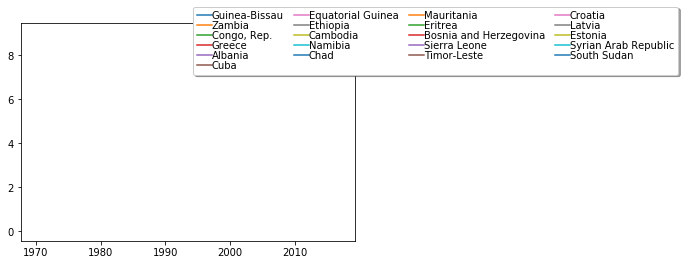

In [134]:

print(posicao_paises_sairam)

labels = []

for i in posicao_paises_sairam:
    
    if len(posicao_paises_sairam[i])==1:
    
        ano = []
        legenda = ''
        posicao = []

        legenda = i

        for j in posicao_paises_sairam[i]:

            ano.append(j[0])
            posicao.append(j[1])
        labels.append(i)

        plt.plot(ano, posicao)
        
    
plt.legend(labels, ncol=4, loc='upper left', 
           bbox_to_anchor=[0.5, 1.1], 
           columnspacing=1.0, labelspacing=0.0,
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True)
plt.show()

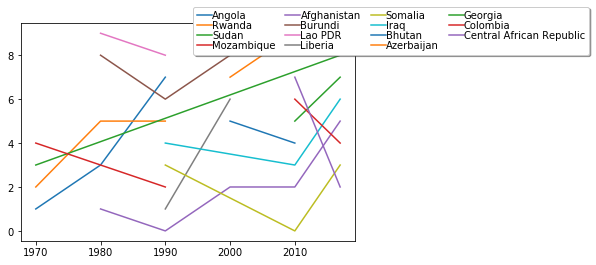

In [135]:
labels = []

for i in posicao_paises_sairam:
    
    if len(posicao_paises_sairam[i])>1:
    
        ano = []
        legenda = ''
        posicao = []

        legenda = i

        for j in posicao_paises_sairam[i]:

            ano.append(j[0])
            posicao.append(j[1])
        labels.append(i)

        plt.plot(ano, posicao)
        
    
plt.legend(labels, ncol=4, loc='upper left', 
           bbox_to_anchor=[0.5, 1.1], 
           columnspacing=1.0, labelspacing=0.0,
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True)
plt.show()